# Кластеризация

In [107]:
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import LabelEncoder, MinMaxScaler, RobustScaler, PowerTransformer, StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline
%config InlineBackend.figure_format = 'svg'
pd.options.display.max_columns = 100
pd.options.display.float_format = '{:,.2f}'.format
sns.set_context("paper", rc={"font.size":12,"axes.titlesize":16,"axes.labelsize":12})

In [108]:
from auxiliary_modules import reduce_mem_usage

**Содержание**
* [Загрузка данных и первичная обработка](#download_and_preprocessing)
    * [Загрузка датасета](#data_download)
    * [Добавление признаков](#add_features)
    * [Пропуски](#null_rows)
    * [Измененение влияния признака в соответствии со значением](#change_feat_weight)
    * [Удаление столбцов](#drop_feats)
* [Анализ данных](#analisys)
    * [Визуализация распределения](#distribution_view)
    * [Корреляция признаков](#heat_map)
* [Нормализация и стандартизация данных](#data_normalizing)
    * [Нормализация](#np_log)
    * [Стандартизация](#min_nax)
* [Понижение размерности и визуализация кластеров](#cluster_visual)
* [Кластеризация K-means](#clusterizing)
* [Оценка кластеризации по центроидам](#evaluating)
* [Анализ по кластерам](#analisys_by_clusters)

1. Взять в датафрейме столбцы оценок
2. Негативные оценки перевернуть
3. Все признаки оптимизируем минмаксом
4. Кластеризация методом К средних
5. Уменьшение признаков
6. 

## Загрузка данных и первичная обработка <a class='anchor' id='download_and_preprocessing'>

#### Загрузка датасета <a class='anchor' id='data_download'>

In [109]:
data = pd.read_csv('data.csv', index_col=0)
df = data.copy()
df.head(7)

,brand_name,product_name,product_id,beauty_point_earned,price_range,price_range_2,categories,default_category,average_rating,total_reviews,average_rating_by_types,total_recommended_count,total_repurchase_maybe_count,total_repurchase_no_count,total_repurchase_yes_count,total_in_wishlist
0,brand_98,MULTI EYE COLOR PALETTE,97802,130,555.00,687.00,Makeup; Eyes; Eyeshadow,Eyeshadow,4.92,5,лучший_длительный_эффект: 5; лучшая_упаковка: ...,5,0,0,5,717
1,brand_98,VELVET LIP TINT,97810,50,264.00,NaN,Makeup; Lips; Lip Cream,Lip Cream,4.58,42,лучший_длительный_эффект: 4.309523809523809; л...,42,10,2,30,682
2,brand_98,LIP COLOR,97822,60,317.00,NaN,Makeup; Lips; Lipstick,Lipstick,0.00,0,NaN,0,0,0,0,173
3,brand_98,MINI MULTI EYE COLOR PALETTE,97833,80,423.00,NaN,Makeup; Eyes; Eyeshadow,Eyeshadow,4.88,6,лучший_длительный_эффект: 4.916666666666667; л...,12,1,0,11,257
4,brand_98,FACE BLUSH,97801,60,300.00,NaN,Makeup; Face; Blush,Blush,4.86,13,лучший_длительный_эффект: 4.9411764705882355; ...,17,2,0,15,387
5,brand_98,BLUR WATER TINT,97817,50,264.00,NaN,Makeup; Lips; Lip Tint,Lip Tint,4.73,51,лучший_длительный_эффект: 4.703703703703703; л...,53,3,3,48,1050
6,brand_98,CLOUD LIP TINT,97818,50,264.00,NaN,Makeup; Lips; Lip Cream,Lip Cream,4.77,17,лучший_длительный_эффект: 4.842105263157895; л...,19,0,0,19,213


Описание датасета

* brand_name - название бренда
* product_name - название продукта
* product_id - id продукта
* beauty_point_earned - количество баллов
* price_range - нижняя граница цены продукта
* price_range_2 - верхняя граница цены продукта
* categories - категории
* default_category - категория
* average_rating - рейтинг по 5-ти бальной шкале
* total_reviews - количество отзывов
* average_rating_by_types - отзывы с оценками
* total_recommended_count - количество рекомендаций
* total_repurchase_maybe_count - количество возможного выкупа продукта
* total_repurchase_no_count - количество без выкупа
* total_repurchase_yes_count - количество выкупа
* total_in_wishlist - количество продукта в листе пожеланий

In [110]:
# Посмотрим столбцы, тип данных, нулевые значения
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7636 entries, 0 to 7635
Data columns (total 16 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   brand_name                    7636 non-null   object 
 1   product_name                  7636 non-null   object 
 2   product_id                    7636 non-null   int64  
 3   beauty_point_earned           7636 non-null   int64  
 4   price_range                   7636 non-null   float64
 5   price_range_2                 554 non-null    float64
 6   categories                    7632 non-null   object 
 7   default_category              7636 non-null   object 
 8   average_rating                7636 non-null   float64
 9   total_reviews                 7636 non-null   int64  
 10  average_rating_by_types       5790 non-null   object 
 11  total_recommended_count       7636 non-null   int64  
 12  total_repurchase_maybe_count  7636 non-null   int64  
 13  total_re

In [111]:
df.isna().sum()

brand_name                         0
product_name                       0
product_id                         0
beauty_point_earned                0
price_range                        0
price_range_2                   7082
categories                         4
default_category                   0
average_rating                     0
total_reviews                      0
average_rating_by_types         1846
total_recommended_count            0
total_repurchase_maybe_count       0
total_repurchase_no_count          0
total_repurchase_yes_count         0
total_in_wishlist                  0
dtype: int64

In [112]:
df = reduce_mem_usage(df)

Memory usage of dataframe is 0.99 MB
Memory usage after optimization is: 0.86 MB
Decreased by 12.9%


In [113]:
df.dtypes

brand_name                      category
product_name                    category
product_id                         int32
beauty_point_earned                int16
price_range                      float32
price_range_2                    float32
categories                      category
default_category                category
average_rating                   float32
total_reviews                      int16
average_rating_by_types         category
total_recommended_count            int16
total_repurchase_maybe_count       int16
total_repurchase_no_count          int16
total_repurchase_yes_count         int16
total_in_wishlist                  int32
dtype: object

#### Добавление признаков <a class='anchor' id='add_features'>

__price__, который получит медианные значения от двух столбцов price_range

In [114]:
df['price'] = df[['price_range','price_range_2']].median(axis=1)

__эффекты__ создадим несколько признаков, разбив столбец по типам эффекта

In [115]:
print(df['average_rating_by_types'][0])

лучший_длительный_эффект: 5; лучшая_упаковка: 4.8; лучший_цвет: 4.8; лучшая_текстура: 5; лучшая_цена: 5


In [116]:
rating_by_types = df['average_rating_by_types'].value_counts().index.to_list()
effect_cols = set()
for line in rating_by_types:
    for part in line.split(';'):
        effect_cols.add(part.split(': ')[0].strip())
print(effect_cols,'\n',len(effect_cols))

for i in effect_cols:
    df[i] = 0
df.head(3)

{'лучшая_упаковка', 'лучшая_текстура', 'лучший_длительный_эффект', 'лучшая_эффективность', 'лучший_запах', 'лучшая_стойкость', 'лучшая_цена', 'лучший_цвет', 'лучший_эффект'} 
 9


,brand_name,product_name,product_id,beauty_point_earned,price_range,price_range_2,categories,default_category,average_rating,total_reviews,average_rating_by_types,total_recommended_count,total_repurchase_maybe_count,total_repurchase_no_count,total_repurchase_yes_count,total_in_wishlist,price,лучшая_упаковка,лучшая_текстура,лучший_длительный_эффект,лучшая_эффективность,лучший_запах,лучшая_стойкость,лучшая_цена,лучший_цвет,лучший_эффект
0,brand_98,MULTI EYE COLOR PALETTE,97802,130,555.00,687.00,Makeup; Eyes; Eyeshadow,Eyeshadow,4.92,5,лучший_длительный_эффект: 5; лучшая_упаковка: ...,5,0,0,5,717,621.00,0,0,0,0,0,0,0,0,0
1,brand_98,VELVET LIP TINT,97810,50,264.00,NaN,Makeup; Lips; Lip Cream,Lip Cream,4.58,42,лучший_длительный_эффект: 4.309523809523809; л...,42,10,2,30,682,264.00,0,0,0,0,0,0,0,0,0
2,brand_98,LIP COLOR,97822,60,317.00,NaN,Makeup; Lips; Lipstick,Lipstick,0.00,0,NaN,0,0,0,0,173,317.00,0,0,0,0,0,0,0,0,0


In [117]:

for i in df[df['average_rating_by_types'].notna()].index:
    for row in df['average_rating_by_types'][i].split(';'):
        effect = row.split(': ')[0].strip()
        rate = round(float(row.split(': ')[1]), 2)
        df[effect][i] = rate


In [118]:
df.head()

,brand_name,product_name,product_id,beauty_point_earned,price_range,price_range_2,categories,default_category,average_rating,total_reviews,average_rating_by_types,total_recommended_count,total_repurchase_maybe_count,total_repurchase_no_count,total_repurchase_yes_count,total_in_wishlist,price,лучшая_упаковка,лучшая_текстура,лучший_длительный_эффект,лучшая_эффективность,лучший_запах,лучшая_стойкость,лучшая_цена,лучший_цвет,лучший_эффект
0,brand_98,MULTI EYE COLOR PALETTE,97802,130,555.00,687.00,Makeup; Eyes; Eyeshadow,Eyeshadow,4.92,5,лучший_длительный_эффект: 5; лучшая_упаковка: ...,5,0,0,5,717,621.00,4.80,5.00,5.00,0.00,0.00,0.00,5.00,4.80,0.00
1,brand_98,VELVET LIP TINT,97810,50,264.00,NaN,Makeup; Lips; Lip Cream,Lip Cream,4.58,42,лучший_длительный_эффект: 4.309523809523809; л...,42,10,2,30,682,264.00,4.79,4.76,4.31,0.00,0.00,0.00,4.33,4.69,0.00
2,brand_98,LIP COLOR,97822,60,317.00,NaN,Makeup; Lips; Lipstick,Lipstick,0.00,0,NaN,0,0,0,0,173,317.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
3,brand_98,MINI MULTI EYE COLOR PALETTE,97833,80,423.00,NaN,Makeup; Eyes; Eyeshadow,Eyeshadow,4.88,6,лучший_длительный_эффект: 4.916666666666667; л...,12,1,0,11,257,423.00,5.00,4.92,4.92,0.00,0.00,0.00,4.75,4.83,0.00
4,brand_98,FACE BLUSH,97801,60,300.00,NaN,Makeup; Face; Blush,Blush,4.86,13,лучший_длительный_эффект: 4.9411764705882355; ...,17,2,0,15,387,300.00,5.00,4.88,4.94,0.00,0.00,0.00,4.76,4.71,0.00


#### Удаление столбцов для анализа <a class='anchor' id='drop_feats'>

In [119]:
df.drop(['brand_name', 'product_name', 'product_id', 'price_range', 'price_range_2', 'categories', 'price', 'default_category','average_rating_by_types'], axis=1, inplace=True)

In [120]:
df.head()

,beauty_point_earned,average_rating,total_reviews,total_recommended_count,total_repurchase_maybe_count,total_repurchase_no_count,total_repurchase_yes_count,total_in_wishlist,лучшая_упаковка,лучшая_текстура,лучший_длительный_эффект,лучшая_эффективность,лучший_запах,лучшая_стойкость,лучшая_цена,лучший_цвет,лучший_эффект
0,130,4.92,5,5,0,0,5,717,4.80,5.00,5.00,0.00,0.00,0.00,5.00,4.80,0.00
1,50,4.58,42,42,10,2,30,682,4.79,4.76,4.31,0.00,0.00,0.00,4.33,4.69,0.00
2,60,0.00,0,0,0,0,0,173,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
3,80,4.88,6,12,1,0,11,257,5.00,4.92,4.92,0.00,0.00,0.00,4.75,4.83,0.00
4,60,4.86,13,17,2,0,15,387,5.00,4.88,4.94,0.00,0.00,0.00,4.76,4.71,0.00


#### Нулевые значения<a class='anchor' id='null_rows'>

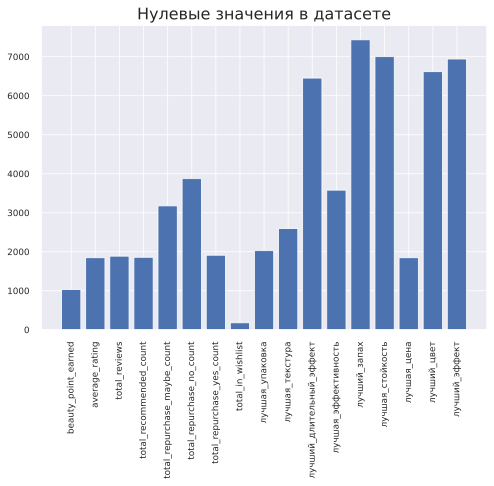

In [121]:
zero_values = []
for i in df.columns:
    zero_values = [df[i][df[i] == 0].count() for i in df]
plt.bar(df.columns, zero_values)
plt.title('Нулевые значения в датасете')
plt.xticks(rotation=90);


In [122]:
index_to_drop = df.query('average_rating == 0').index.to_list()
df.drop(index_to_drop, axis=0, inplace=True)
df.shape

(5790, 17)

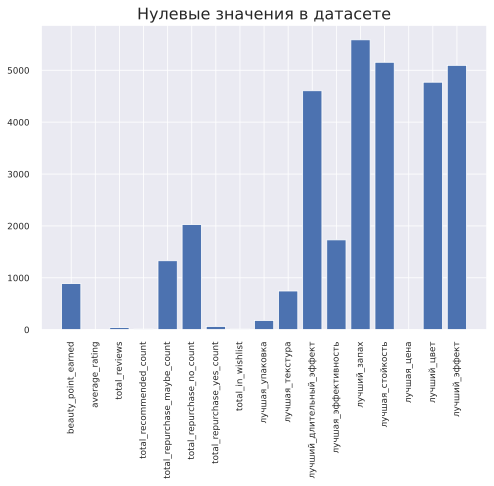

In [123]:
zero_values_1 = []
for i in df.columns:
    zero_values = [df[i][df[i] == 0].count() for i in df]
plt.bar(df.columns, zero_values)
plt.title('Нулевые значения в датасете')
plt.xticks(rotation=90);

## Анализ признаков <a class='anchor' id='analisys'>

Из распределения данных видно, что более 90% всех значений в признаках по пятибалльному рейтингу продукции находятся в промежутке от 4 до 5 баллов. Поэтому наличие других оценок также важно для понимания предпочтения выбора продукции

#### Визуализация распределения <a class='anchor' id='distribution_view'>

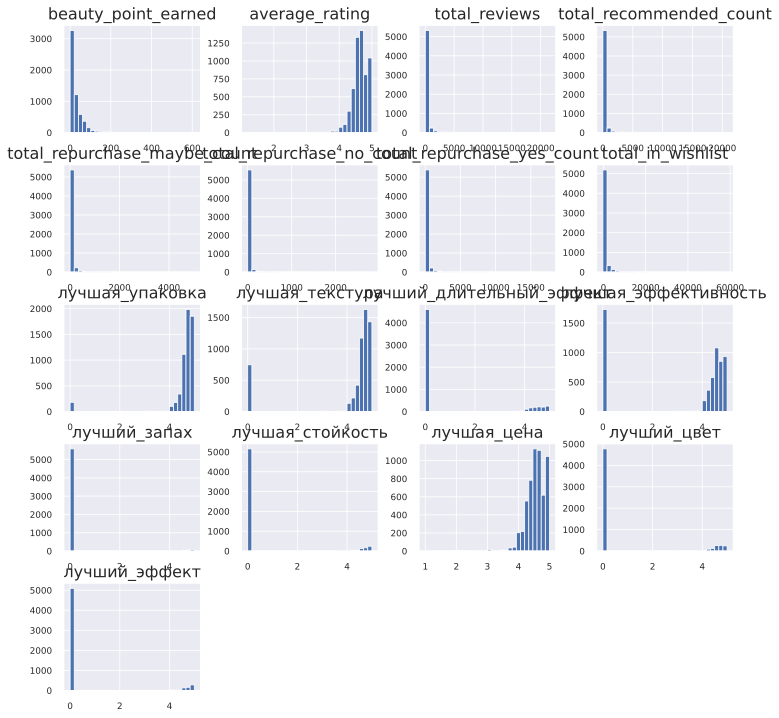

In [124]:
df.hist(figsize=(12,12), bins=30);

In [125]:
# Посмотрим статистику
df.describe()

,beauty_point_earned,average_rating,total_reviews,total_recommended_count,total_repurchase_maybe_count,total_repurchase_no_count,total_repurchase_yes_count,total_in_wishlist,лучшая_упаковка,лучшая_текстура,лучший_длительный_эффект,лучшая_эффективность,лучший_запах,лучшая_стойкость,лучшая_цена,лучший_цвет,лучший_эффект
count,"5,790.00","5,790.00","5,790.00","5,790.00","5,790.00","5,790.00","5,790.00","5,790.00","5,790.00","5,790.00","5,790.00","5,790.00","5,790.00","5,790.00","5,790.00","5,790.00","5,790.00"
mean,31.37,4.64,261.39,246.04,53.55,20.42,187.11,811.68,4.58,4.09,0.93,3.23,0.17,0.52,4.57,0.82,0.57
std,37.70,0.27,970.06,914.43,192.84,91.00,712.62,"2,329.43",0.85,1.59,1.83,2.13,0.87,1.47,0.32,1.77,1.53
min,0.00,1.20,0.00,0.00,0.00,0.00,0.00,-259.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00
25%,10.00,4.52,5.00,5.00,1.00,0.00,4.00,69.00,4.60,4.46,0.00,0.00,0.00,0.00,4.40,0.00,0.00
50%,20.00,4.65,26.00,25.00,5.00,2.00,18.00,226.50,4.75,4.67,0.00,4.48,0.00,0.00,4.58,0.00,0.00
75%,40.00,4.79,132.00,124.00,29.00,10.00,93.00,657.00,4.89,4.83,0.00,4.71,0.00,0.00,4.76,0.00,0.00
max,610.00,5.00,"21,536.00","20,804.00","5,025.00","2,824.00","17,653.00","58,568.00",5.00,5.00,5.00,5.00,5.00,5.00,5.00,5.00,5.00


В нижеуказанных графиках отображается сильная корреляция между признаками

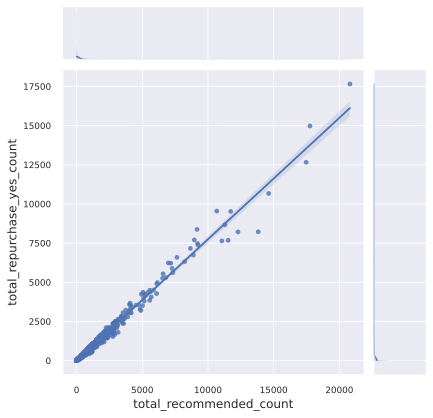

In [126]:
sns.jointplot(df, x='total_recommended_count', y='total_repurchase_yes_count', kind='reg');

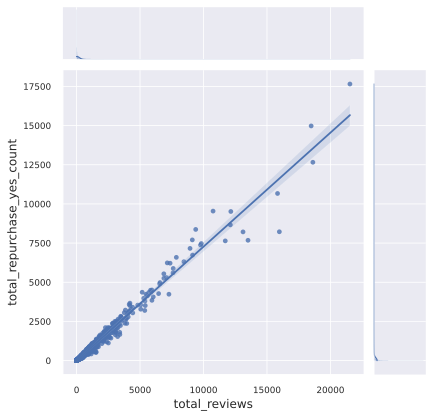

In [127]:
sns.jointplot(df, x='total_reviews', y='total_repurchase_yes_count', kind='reg');

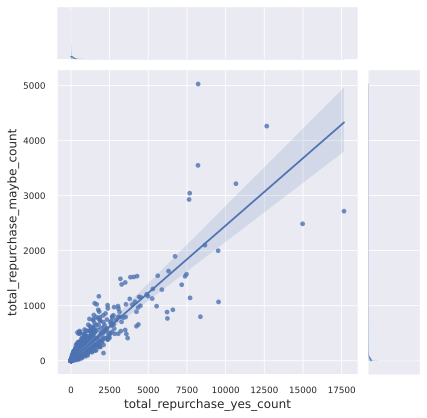

In [128]:
sns.jointplot(df, x='total_repurchase_yes_count', y='total_repurchase_maybe_count', kind='reg');

Ниже меньшая зависимость между противоположными признаками. Признак `total_repurchase_no_count` должен находится __в обратной зависимости__, а значит мы изменим значение на 1/признак

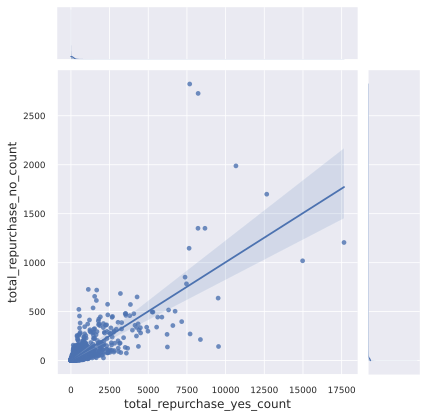

In [129]:
sns.jointplot(df, x='total_repurchase_yes_count', y='total_repurchase_no_count', kind='reg');

#### Корреляция признаков <a class='anchor' id='heat_map'>

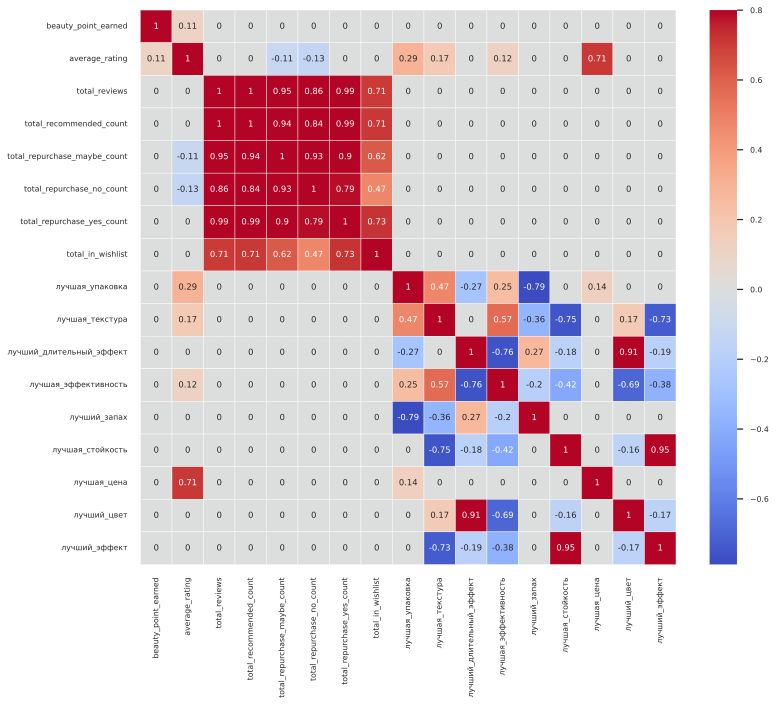

In [130]:
plt.figure(figsize=(12,10))
sns.set(font_scale=0.7)

corr = df.corr()
corr[np.abs(corr)<0.1] = 0

sns.heatmap(corr, annot=True, linewidths=0.4, cmap='coolwarm', vmax=0.8);

In [131]:
feats_to_drop = ['total_reviews', 'total_recommended_count','total_repurchase_maybe_count']
df_dropped = df.copy()
df_dropped.drop(feats_to_drop, axis=1, inplace=True)

#### Измененение влияния признака в соответствии со значением <a class='anchor' id='change_feat_weight'>

In [132]:
# Посмотрим признаки с отриц значениями:
for i in df_dropped.columns:
    if df_dropped[i].min() < 0:
        print(f'Признак с отрицательным значением: {i}')

Признак с отрицательным значением: total_in_wishlist


In [133]:
df_dropped['total_repurchase_no_count'][df_dropped['total_repurchase_no_count']!=0] = np.round(1/df_dropped['total_repurchase_no_count'], 2)

df_dropped['total_in_wishlist'][df_dropped['total_in_wishlist']<0] = np.round(1/(df_dropped['total_in_wishlist'] * -1), 1)

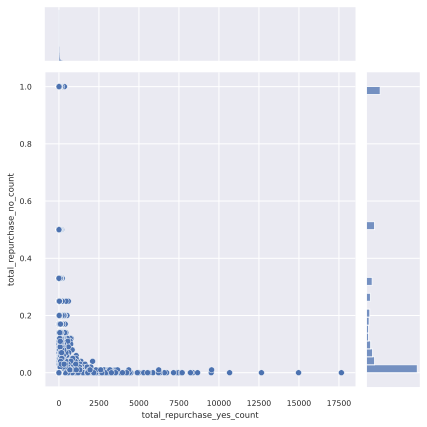

In [134]:
sns.jointplot(df_dropped, x='total_repurchase_yes_count', y='total_repurchase_no_count');

## Нормализация и стандартизация признаков <a class='anchor' id='data_normalizing'>

In [135]:
df_dropped.describe()

,beauty_point_earned,average_rating,total_repurchase_no_count,total_repurchase_yes_count,total_in_wishlist,лучшая_упаковка,лучшая_текстура,лучший_длительный_эффект,лучшая_эффективность,лучший_запах,лучшая_стойкость,лучшая_цена,лучший_цвет,лучший_эффект
count,"5,790.00","5,790.00","5,790.00","5,790.00","5,790.00","5,790.00","5,790.00","5,790.00","5,790.00","5,790.00","5,790.00","5,790.00","5,790.00","5,790.00"
mean,31.37,4.64,0.21,187.11,813.07,4.58,4.09,0.93,3.23,0.17,0.52,4.57,0.82,0.57
std,37.70,0.27,0.33,712.62,"2,328.91",0.85,1.59,1.83,2.13,0.87,1.47,0.32,1.77,1.53
min,0.00,1.20,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00
25%,10.00,4.52,0.00,4.00,69.00,4.60,4.46,0.00,0.00,0.00,0.00,4.40,0.00,0.00
50%,20.00,4.65,0.04,18.00,226.50,4.75,4.67,0.00,4.48,0.00,0.00,4.58,0.00,0.00
75%,40.00,4.79,0.25,93.00,657.00,4.89,4.83,0.00,4.71,0.00,0.00,4.76,0.00,0.00
max,610.00,5.00,1.00,"17,653.00","58,568.00",5.00,5.00,5.00,5.00,5.00,5.00,5.00,5.00,5.00


### Нормализация <a class='anchor' id='np_log'>

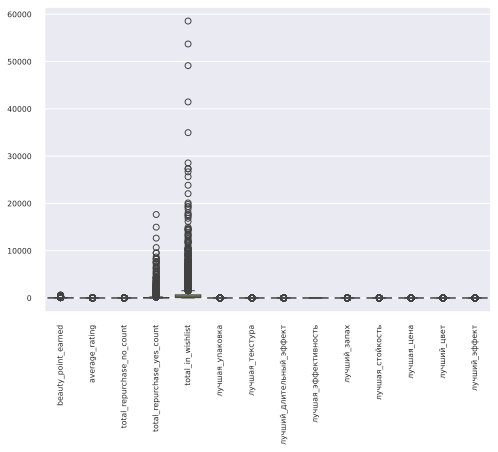

In [136]:
sns.boxplot(df_dropped)
plt.xticks(rotation=90);

In [137]:
def data_normilizer(df, method):
    for feat in df.columns:
        if method == 'log':            
            df_log = df.copy()
            df_log[feat] = np.log(df_log[feat] + 0.0001)
            return df_log
        
        elif method == 'sqrt':
            df_sqrt = df.copy()
            df_sqrt[feat] = np.sqrt(df_sqrt[feat])
            return df_sqrt
        
        elif method == 'boxcox':
            df_boxcox = df.copy()
            df_boxcox[feat], _ = stats.boxcox(df_boxcox[feat] + 0.0001)
            return df_boxcox
        
        else:
            power_transfomator = PowerTransformer(method='yeo-johnson')
            df_yeo = power_transfomator.fit_transform(df)
            df_yeo = pd.DataFrame(df_yeo, columns=df.columns)
            return df_yeo


In [138]:
df_log = data_normilizer(df_dropped,'log')
df_sqrt = data_normilizer(df_dropped, 'sqrt')
df_boxcox = data_normilizer(df_dropped, 'boxcox')
df_yeo = data_normilizer(df_dropped, 'yeo')

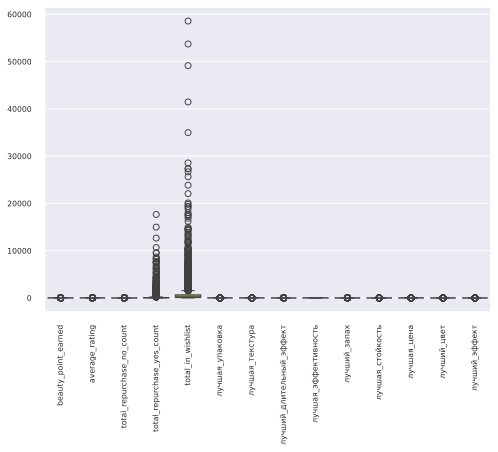

In [139]:
sns.boxplot(df_log)
plt.xticks(rotation=90);

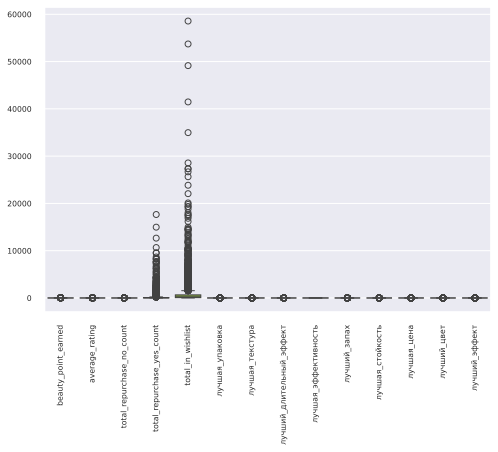

In [140]:
sns.boxplot(df_sqrt)
plt.xticks(rotation=90);

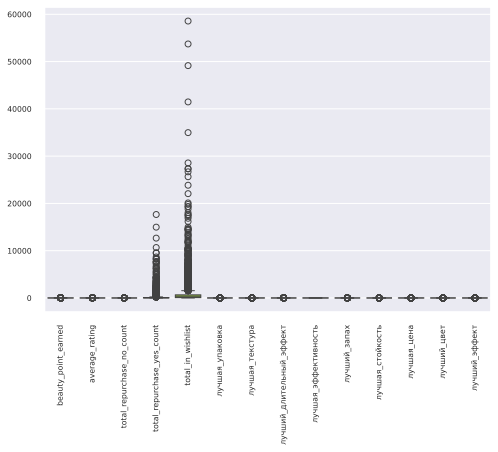

In [141]:
sns.boxplot(df_boxcox)
plt.xticks(rotation=90);

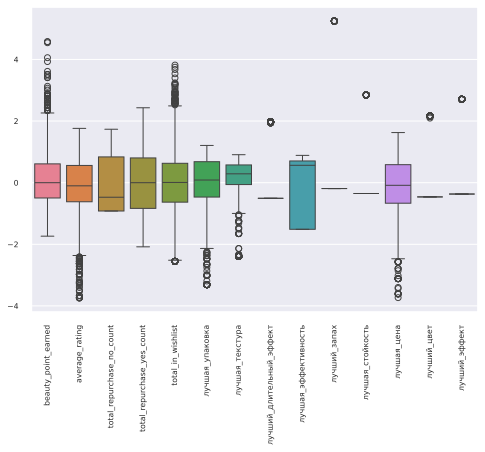

In [142]:
sns.boxplot(df_yeo)
plt.xticks(rotation=90);

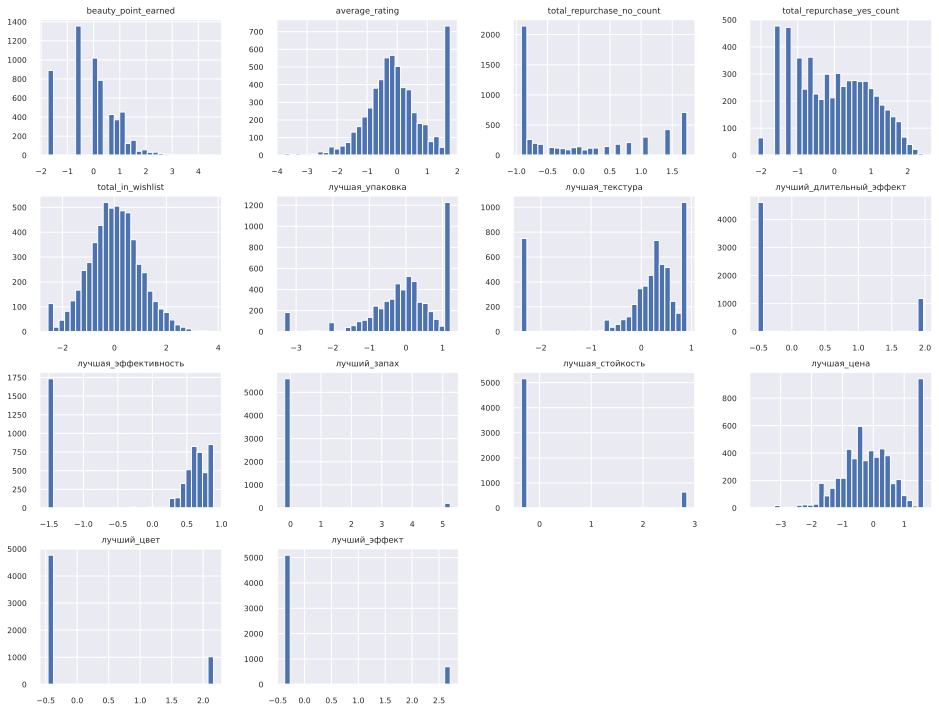

In [143]:
df_yeo.hist(figsize=(16,12), bins=30);

### Стандартизация <a class='anchor' id="min_max">

In [144]:
scaler= MinMaxScaler((0,5))
df_scaled = pd.DataFrame(scaler.fit_transform(df_yeo), columns=df_dropped.columns)

## Кластеризация <a class='anchor' id='clusterizing'>

In [145]:
model = KMeans()

Визуализация определения количества кластеров
7


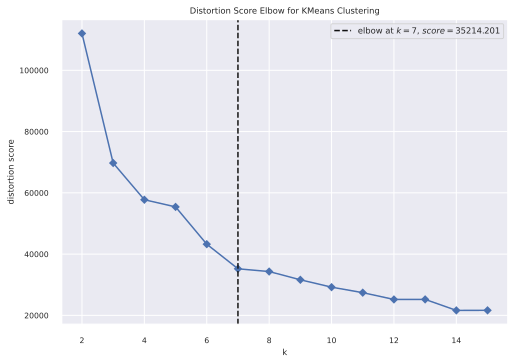

In [146]:
print('Визуализация определения количества кластеров')
Elbow_M = KElbowVisualizer(model, k=15, timings=False)
Elbow_M.fit(df_scaled)
number_of_clusters = Elbow_M.elbow_value_
print(number_of_clusters)
Elbow_M.show();


###  K-Means <a class='anchor' id='kmeans'>

In [147]:
kmeans = KMeans(n_clusters=number_of_clusters, random_state=42)
kmeans_clasters = kmeans.fit_predict(df_scaled)
df_dropped['Clusters'] = kmeans_clasters

df_dropped['Clusters'].value_counts()

Clusters
4    1585
0    1284
5    1143
3     704
1     595
6     316
2     163
Name: count, dtype: int64

### Агломеративная кластеризаци <a class='anchor' id='agglomerative_clust'>

In [148]:
from sklearn.cluster import AgglomerativeClustering
model_aglom = AgglomerativeClustering(n_clusters=number_of_clusters)
labels = model_aglom.fit_predict(df_scaled)
df_dropped['labels'] = labels
df_dropped['labels'].value_counts()

labels
3    1489
1    1315
5    1125
0    1020
2     550
4     164
6     127
Name: count, dtype: int64

## Визуализация кластеров с понижением размерности PCA <a class='anchor' id='cluster_visualizing'>

### PCA <a class='anchor' id='pca'>

In [149]:
def feat_reducer(data, n_components: int):
    
    # Понижаем размерность до n компонент

    reducer = PCA(n_components=n_components, random_state=42)
    components = reducer.fit_transform(data)
    cols = ['Componenta_'+str(i)  for i in range(1, n_components+1)]
    data_reduced = pd.DataFrame(components, columns=cols)
    print(data_reduced.shape)

    return data_reduced

In [150]:
data_reduced = feat_reducer(df_scaled, 3)

(5790, 3)


 ### Визуализация кластеров <a class='anchor' id='visual'>

In [151]:
def claster_visualisator(data, clusters):
    
    # добавим оси
    x, y, z = data_reduced['Componenta_1'], data_reduced['Componenta_2'], data_reduced['Componenta_3']
    
    # посмотрим на распределение всех компонент
    # fig = plt.figure(figsize=(10,8))
    # ax = fig.add_subplot(111, projection="3d")
    # ax.scatter(x,y,z)
    # ax.set_title("A 3D Projection Of Data In The Reduced Dimension")
    # plt.show();
    
    # посмотрим данные компонент по кластерам
    fig = plt.figure(figsize=(12,8))
    ax = plt.subplot(111, projection='3d', label="bla")
    ax.scatter(y, x, z, s=40, c=clusters, marker='o', cmap='Accent')
    ax.set_title("The Plot Of The Clusters")
   
    # ax.set_xlim(0,10)
    # ax.set_ylim(-4,2)
    # ax.set_zlim(0,10)

    plt.show()

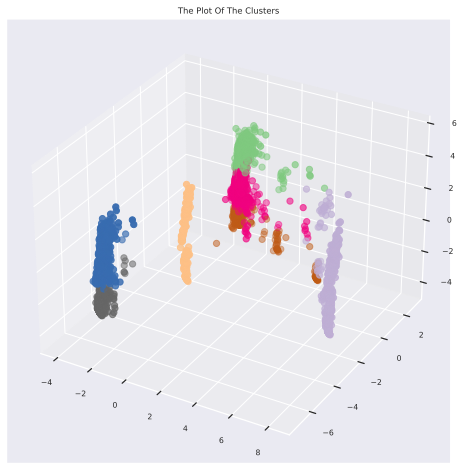

In [152]:
claster_visualisator(data_reduced, df_dropped['Clusters'])

## Анализ по кластерам <a class='anchor' id='analisys_by_clusters'>

In [153]:
print(df_dropped['Clusters'].value_counts())

Clusters
4    1585
0    1284
5    1143
3     704
1     595
6     316
2     163
Name: count, dtype: int64


In [154]:
ind = df_dropped['Clusters'].value_counts().index.tolist()
cluster_dict = dict(zip(ind, [i for i in range(1, number_of_clusters+1)]))
df_dropped['Clusters'] = df_dropped['Clusters'].replace(ind, cluster_dict.values())

In [155]:
df_dropped['Clusters'].value_counts()

Clusters
1    1585
2    1284
3    1143
4     704
5     595
6     316
7     163
Name: count, dtype: int64

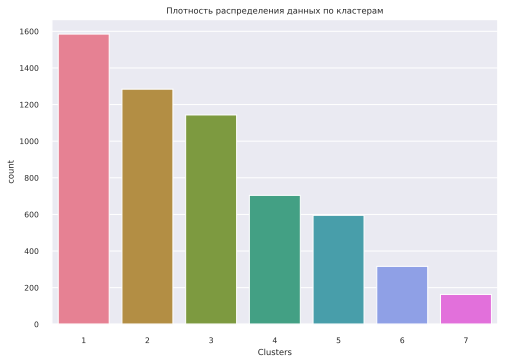

In [156]:
pl = sns.countplot(x=df_dropped["Clusters"], palette='husl')
pl.set_title("Плотность распределения данных по кластерам")
plt.show();


подготовим загруженный  датасет для анализа

In [157]:
def data_transformer(data):
    
    # создадим копию от скаченного датасета
    df_final = data.copy()  
    
    # заменим столбцы по цене
    df_final['price'] = df_final[['price_range', 'price_range_2']].median(axis=1)
    df_final.drop(['price_range', 'price_range_2'], axis=1, inplace=True)
    
    # добавим рейтинг по свойствам из столбца "average_rating_by_types"
    for i in effect_cols:
        df_final[i] = df[i]
    
    # Добавим кластеры
    df_final['cluster'] = df_dropped['Clusters']    
    
    # удалим "лишние" столбцы и нулевые строки
    df_final.drop(index_to_drop, axis=0, inplace=True)
    df_final.drop('average_rating_by_types', axis=1, inplace=True)
        
    return df_final

In [158]:
df_final = data_transformer(data)
df_final.head()

,brand_name,product_name,product_id,beauty_point_earned,categories,default_category,average_rating,total_reviews,total_recommended_count,total_repurchase_maybe_count,total_repurchase_no_count,total_repurchase_yes_count,total_in_wishlist,price,лучшая_упаковка,лучшая_текстура,лучший_длительный_эффект,лучшая_эффективность,лучший_запах,лучшая_стойкость,лучшая_цена,лучший_цвет,лучший_эффект,cluster
0,brand_98,MULTI EYE COLOR PALETTE,97802,130,Makeup; Eyes; Eyeshadow,Eyeshadow,4.92,5,5,0,0,5,717,621.00,4.80,5.00,5.00,0.00,0.00,0.00,5.00,4.80,0.00,6.00
1,brand_98,VELVET LIP TINT,97810,50,Makeup; Lips; Lip Cream,Lip Cream,4.58,42,42,10,2,30,682,264.00,4.79,4.76,4.31,0.00,0.00,0.00,4.33,4.69,0.00,4.00
3,brand_98,MINI MULTI EYE COLOR PALETTE,97833,80,Makeup; Eyes; Eyeshadow,Eyeshadow,4.88,6,12,1,0,11,257,423.00,5.00,4.92,4.92,0.00,0.00,0.00,4.75,4.83,0.00,6.00
4,brand_98,FACE BLUSH,97801,60,Makeup; Face; Blush,Blush,4.86,13,17,2,0,15,387,300.00,5.00,4.88,4.94,0.00,0.00,0.00,4.76,4.71,0.00,6.00
5,brand_98,BLUR WATER TINT,97817,50,Makeup; Lips; Lip Tint,Lip Tint,4.73,51,53,3,3,48,1050,264.00,4.78,4.78,4.70,0.00,0.00,0.00,4.63,4.76,0.00,4.00


In [159]:
# 
df_final[['category_'+str(i) for i in range(1,4)]] = df_final['categories'].str.split(';', expand=True)
df_final.drop('categories', axis=1, inplace=True)
df_final.head()

,brand_name,product_name,product_id,beauty_point_earned,default_category,average_rating,total_reviews,total_recommended_count,total_repurchase_maybe_count,total_repurchase_no_count,total_repurchase_yes_count,total_in_wishlist,price,лучшая_упаковка,лучшая_текстура,лучший_длительный_эффект,лучшая_эффективность,лучший_запах,лучшая_стойкость,лучшая_цена,лучший_цвет,лучший_эффект,cluster,category_1,category_2,category_3
0,brand_98,MULTI EYE COLOR PALETTE,97802,130,Eyeshadow,4.92,5,5,0,0,5,717,621.00,4.80,5.00,5.00,0.00,0.00,0.00,5.00,4.80,0.00,6.00,Makeup,Eyes,Eyeshadow
1,brand_98,VELVET LIP TINT,97810,50,Lip Cream,4.58,42,42,10,2,30,682,264.00,4.79,4.76,4.31,0.00,0.00,0.00,4.33,4.69,0.00,4.00,Makeup,Lips,Lip Cream
3,brand_98,MINI MULTI EYE COLOR PALETTE,97833,80,Eyeshadow,4.88,6,12,1,0,11,257,423.00,5.00,4.92,4.92,0.00,0.00,0.00,4.75,4.83,0.00,6.00,Makeup,Eyes,Eyeshadow
4,brand_98,FACE BLUSH,97801,60,Blush,4.86,13,17,2,0,15,387,300.00,5.00,4.88,4.94,0.00,0.00,0.00,4.76,4.71,0.00,6.00,Makeup,Face,Blush
5,brand_98,BLUR WATER TINT,97817,50,Lip Tint,4.73,51,53,3,3,48,1050,264.00,4.78,4.78,4.70,0.00,0.00,0.00,4.63,4.76,0.00,4.00,Makeup,Lips,Lip Tint


In [160]:
cat1 = df_final['category_1'].unique().tolist()
cat2 = df_final['category_2'].unique().tolist()
cat3 = df_final['category_3'].unique().tolist()

In [161]:
clusters = df_final.groupby(['cluster'])
main_feats = ['price','total_in_wishlist', 'average_rating', 'total_reviews', 'beauty_point_earned','total_repurchase_yes_count','total_repurchase_no_count']

In [162]:
clusters[main_feats].mean()

,price,total_in_wishlist,average_rating,total_reviews,beauty_point_earned,total_repurchase_yes_count,total_repurchase_no_count
cluster,,,,,,,
1.00,149.55,"1,839.28",4.52,673.30,26.68,484.40,53.40
2.00,179.04,289.44,4.59,42.56,31.49,32.20,2.50
3.00,231.86,106.65,4.88,6.10,42.06,5.52,0.00
4.00,123.88,"1,441.26",4.54,482.29,19.60,333.65,38.59
5.00,195.63,297.02,4.66,61.33,33.55,44.18,4.55
6.00,195.80,148.18,4.84,7.30,34.46,6.89,0.00
7.00,216.96,322.99,4.56,38.72,37.85,28.03,3.02


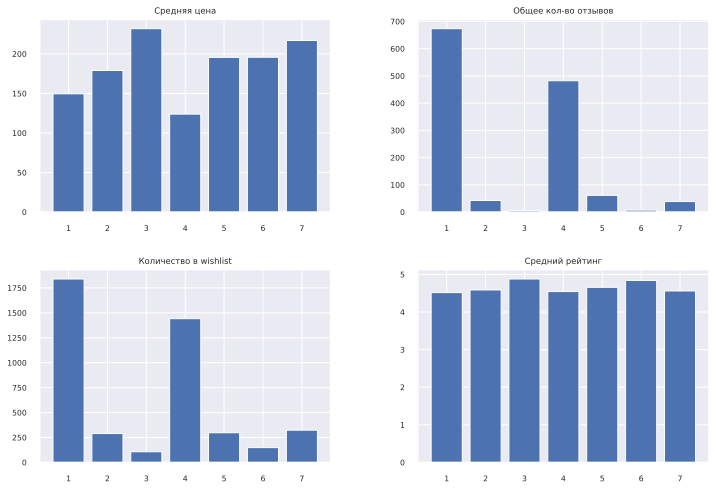

In [165]:
x = [i for i in range(1, number_of_clusters+1)]
fig, ax = plt.subplots(nrows=2, ncols=2)
ax1, ax2, ax3, ax4 = ax.flatten()

ax1.bar(x, clusters['price'].mean())
ax1.set_title('Средняя цена')

ax3.bar(x, clusters['total_in_wishlist'].mean())
ax3.set_title('Количество в wishlist')

ax4.bar(x, clusters['average_rating'].mean())
ax4.set_title('Средний рейтинг')

ax2.bar(x, clusters['total_reviews'].mean())
ax2.set_title('Общее кол-во отзывов')

fig.set_size_inches(12, 8)
plt.subplots_adjust(wspace=0.3, hspace=0.3)

In [210]:
# df_final['category_1'].value_counts()[:2]
df_final.groupby(['cluster'])[['лучший_длительный_эффект', 'лучший_цвет', 'лучшая_текстура', 'лучший_эффект', 'лучшая_эффективность', 'лучшая_упаковка',	'лучшая_стойкость',	'лучшая_цена',	'лучший_запах']].mean()

,лучший_длительный_эффект,лучший_цвет,лучшая_текстура,лучший_эффект,лучшая_эффективность,лучшая_упаковка,лучшая_стойкость,лучшая_цена,лучший_запах
cluster,,,,,,,,,
1.00,0.00,0.00,4.52,0.03,4.47,4.60,0.00,4.44,0.00
2.00,0.00,0.00,4.64,0.06,4.53,4.68,0.00,4.47,0.05
3.00,0.00,0.00,4.89,0.31,4.87,4.90,0.18,4.83,0.12
4.00,4.43,4.54,4.56,0.00,0.01,4.68,0.00,4.52,0.00
5.00,0.00,0.00,0.34,4.68,0.35,4.69,4.67,4.55,0.00
6.00,4.79,4.83,4.86,0.00,0.11,4.91,0.00,4.80,0.00
7.00,4.46,0.00,0.00,0.00,0.00,0.03,0.00,4.57,4.63


In [221]:
cluster_category_top_3= dict()
for num in x:
    temp = 'cluster == '+str(num)
    cluster_category_top_3[str(num)] = df_final.query(temp)['category_1'].value_counts()[:3]

In [260]:
df_final['category_1'].value_counts()[:10]

category_1
Skincare              2677
Makeup                 996
Bath & Body            560
Hair Care              486
Accessories            469
Fragrance              161
Nail Care               90
Chăm sóc cơ thể         61
Shaving & Grooming      56
Sanitary                41
Name: count, dtype: int64

In [255]:
cluster_category_top_3.values()

dict_values([category_1
Skincare       1160
Bath & Body     185
Hair Care       164
Name: count, dtype: int64, category_1
Skincare       793
Hair Care      213
Bath & Body    197
Name: count, dtype: int64, category_1
Skincare       724
Bath & Body    177
Hair Care      109
Name: count, dtype: int64, category_1
Makeup                 692
Payday Batch 1 All       4
Shop By Departments      3
Name: count, dtype: int64, category_1
Accessories                    465
Nail Care                       44
The 80s is Back Makeup Look     22
Name: count, dtype: int64, category_1
Makeup                         304
The 80s is Back Makeup Look      3
Rock and Kohl Makeup Look        3
Name: count, dtype: int64, category_1
Fragrance              161
Chăm sóc cơ thể          1
Shop By Departments      1
Name: count, dtype: int64])

In [267]:
star_rating = df_final.groupby(['cluster'])[['лучший_длительный_эффект', 'лучший_цвет', 'лучшая_текстура', 'лучший_эффект', 'лучшая_эффективность', 'лучшая_упаковка',	'лучшая_стойкость',	'лучшая_цена',	'лучший_запах']].mean()
star_rating

,лучший_длительный_эффект,лучший_цвет,лучшая_текстура,лучший_эффект,лучшая_эффективность,лучшая_упаковка,лучшая_стойкость,лучшая_цена,лучший_запах
cluster,,,,,,,,,
1.00,0.00,0.00,4.52,0.03,4.47,4.60,0.00,4.44,0.00
2.00,0.00,0.00,4.64,0.06,4.53,4.68,0.00,4.47,0.05
3.00,0.00,0.00,4.89,0.31,4.87,4.90,0.18,4.83,0.12
4.00,4.43,4.54,4.56,0.00,0.01,4.68,0.00,4.52,0.00
5.00,0.00,0.00,0.34,4.68,0.35,4.69,4.67,4.55,0.00
6.00,4.79,4.83,4.86,0.00,0.11,4.91,0.00,4.80,0.00
7.00,4.46,0.00,0.00,0.00,0.00,0.03,0.00,4.57,4.63
